<a href="https://colab.research.google.com/github/arfianaja/yolov5_train/blob/main/kelvin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

install requirements

In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16057, done.
remote: Total 16057 (delta 0), reused 0 (delta 0), pack-reused 16057
Receiving objects: 100% (16057/16057), 14.66 MiB | 4.92 MiB/s, done.
Resolving deltas: 100% (11028/11028), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 58.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.2/645.2 kB 52.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.1.0 which is incompatible.
Setup complete. Using torch 2.1.0+cu118 (Tesla T4)


In [ ]:
!pip install roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.7 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Successfully uninstalled opencv-python-headless-4.8.1.78
  Attempting uninstall: idna
    Found existing

In [ ]:
#follow the link below to get your download code from from Roboflow
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="ghYerxhpNPg3ujf6nhGy", model_format="yolov5", notebook="roboflow-yolov5")

In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

masukkan kode dari roboflow


In [ ]:
%cd /content/yolov5/
#after following the link above, recieve python code with these fields filled in
#from roboflow import Roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="ghYerxhpNPg3ujf6nhGy")
project = rf.workspace("universitas-muhammadiyah-sorong").project("manusia-wbvme")
dataset = project.version(2).download("yolov5")

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/manusia-2 in yolov5pytorch:: 100%|██████████| 2026/2026 [00:00<00:00, 2085.26it/s]


Train Our Custom YOLOv5 model
Here, we are able to pass a number of arguments:

img: menentukan ukuran gambar masukan

batch: menentukan ukuran batch

epochs: menentukan jumlah periode pelatihan. (Catatan: sering kali, 3000+ adalah umum di sini!)

data: Lokasi dataset kami disimpan di dataset.location

weights: tentukan jalur ke bobot untuk memulai transfer pembelajaran. Di sini kami memilih pos pemeriksaan pretrained COCO umum.

cache: gambar cache untuk pelatihan lebih cepat

In [ ]:
!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache --name yolov5s_results

2023-11-13 10:52:27.898619: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-13 10:52:27.898688: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-13 10:52:27.898777: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/datasets/manusia-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=

** Evaluasi Performa Detektor YOLOv5 Khusus Kerugian pelatihan dan metrik kinerja disimpan ke Tensorboard dan juga ke file log.**

**If you are new to these metrics, the one you want to focus on is mAP_0.5 - learn more about mean average precision here.**


In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/datasets/manusia-2/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/112 /content/datasets/manusia-2/test/images/00060_jpg.rf.054609bdbf6e0c842ea3263b273508d0.jpg: 416x416 4 orangs, 8.3ms
image 2/112 /content/datasets/manusia-2/test/images/00462_jpg.rf.edb58240d546782f93024c980ae2f6e0.jpg: 416x416 1 orang, 7.4ms
image 3/112 /content/datasets/manusia-2/test/i

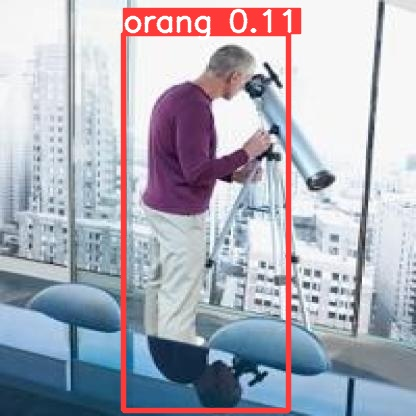

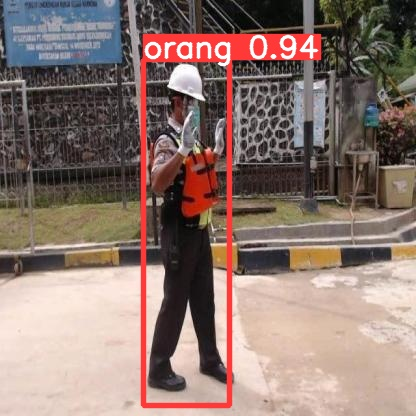

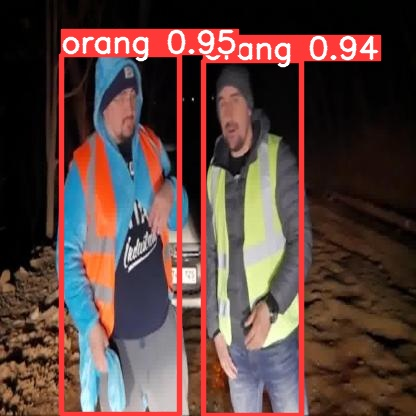

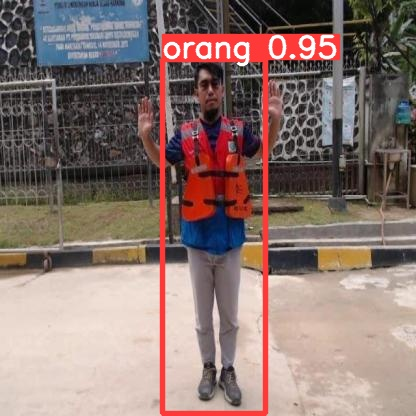

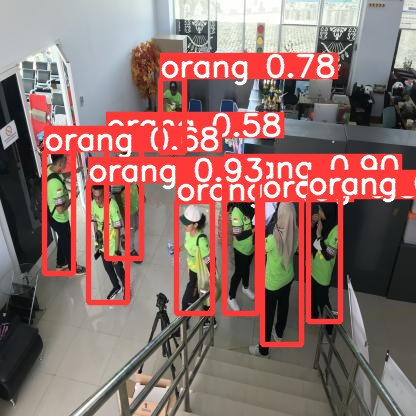

...

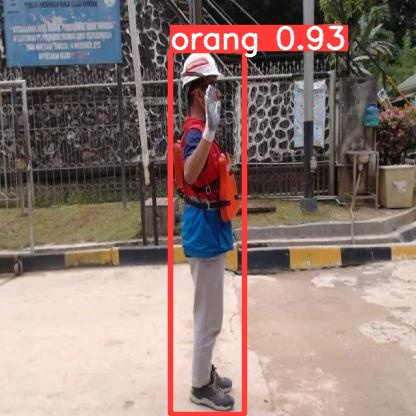

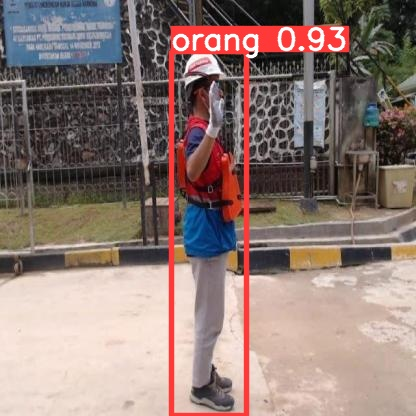

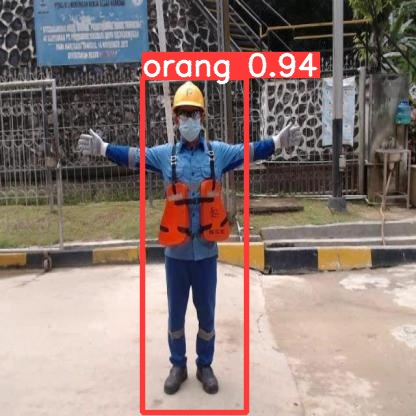

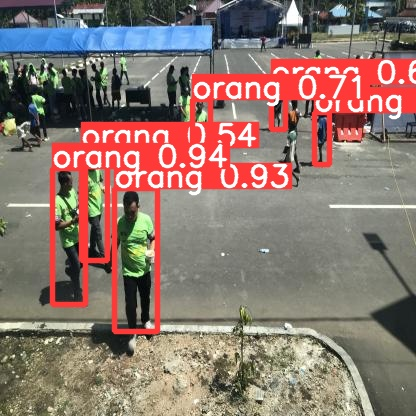

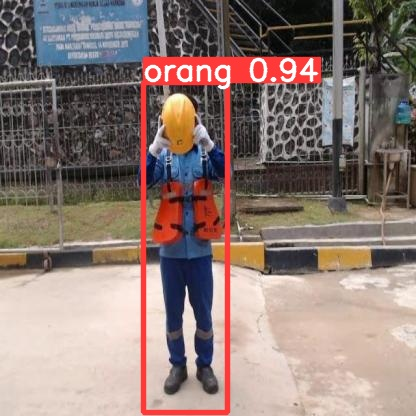

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!python val.py --weights runs/train/yolov5s_results/weights/best.pt --data {dataset.location}/data.yaml --img 416 --iou 0.65 --half

val: data=/content/datasets/manusia-2/data.yaml, weights=['runs/train/yolov5s_results/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/datasets/manusia-2/valid/labels.cache... 112 images, 1 backgrounds, 0 corrupt: 100% 112/112 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 4/4 [00:03<00:00,  1.12it/s]
                   all        112        222      0.825      0.872      0.863      0.548
Speed: 0.1ms pre-process, 9.7ms inference, 3.6ms NMS per image at shape (32, 3, 416, 4

In [ ]:
!ls runs/train/yolov5s_results

confusion_matrix.png				   PR_curve.png		  val_batch0_pred.jpg
events.out.tfevents.1699872750.c761d2d21406.914.0  R_curve.png		  val_batch1_labels.jpg
F1_curve.png					   results.csv		  val_batch1_pred.jpg
hyp.yaml					   results.png		  val_batch2_labels.jpg
labels_correlogram.jpg				   train_batch0.jpg	  val_batch2_pred.jpg
labels.jpg					   train_batch1.jpg	  weights
opt.yaml					   train_batch2.jpg
P_curve.png					   val_batch0_labels.jpg


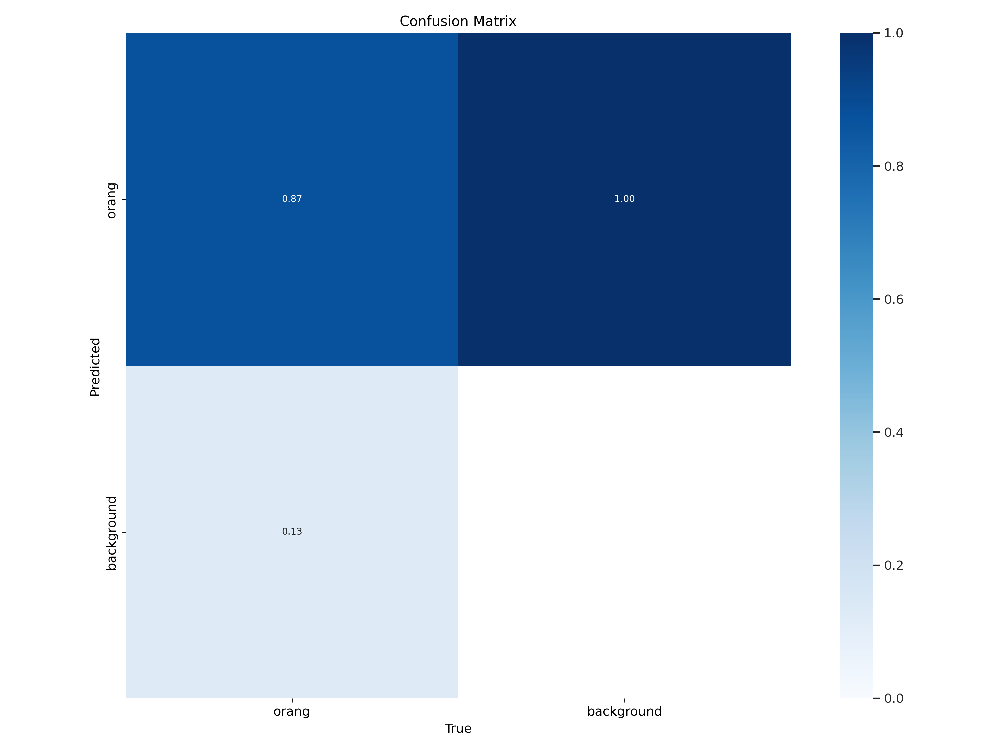

In [ ]:
from utils.plots import plot_results
Image(filename='runs/train/yolov5s_results/confusion_matrix.png', width=1000)

In [ ]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source /content/61270902b97fa.jpg

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/61270902b97fa.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/61270902b97fa.jpg: 320x416 (no detections), 49.7ms
Speed: 0.4ms pre-process, 49.7ms inference, 36.4ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp2


In [ ]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/P_curve.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/PR_curve.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/confusion_matrix.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/R_curve.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/F1_curve.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [20]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>